### Imports

In [3]:
import pandas as pd
import numpy as np
import pywt
import math

from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import MSTL
from statsmodels.tsa.seasonal import STL
from tslearn.metrics import cdist_dtw
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler
from pycwt.helpers import find
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.decomposition import PCA
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.cluster import KMeans


In [4]:
df=pd.read_csv('../../../data/dataset.csv')

In [5]:
df.tail(5)

,date,demand,net_generation,total_interchange,net_generation_coal,net_generation_natural_gas,net_generation_nuclear,net_generation_hydropower_and_pumped_storage,net_generation_solar,net_generation_wind,...,TOBS,WESD,WSFG,WT01,WT03,WT04,WT05,WT06,WT11,consumption
3191,2024-09-26,72928.0,72284.0,-1913.0,22324.0,28769.0,10857.0,795.0,2569.0,6648.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83902.0
3192,2024-09-27,70208.0,66866.0,-4587.0,19276.0,25047.0,10850.0,839.0,1461.0,9149.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80772.0
3193,2024-09-28,68188.0,64603.0,-4712.0,18684.0,23013.0,10067.0,882.0,1753.0,9947.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78448.0
3194,2024-09-29,68686.0,64901.0,-4938.0,19005.0,24269.0,10066.0,845.0,1846.0,8634.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79021.0
3195,2024-09-30,75171.0,73779.0,-3023.0,19528.0,28041.0,10058.0,883.0,1905.0,13132.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86482.0


## Prepare the Data

Due to us using demand as a proxy for consumption it will have to be dropped as a feature.

Everything else will either have to be dropped if there is less that 90% non-nan values. Everything else will be backward filled and forward filled.

In [6]:
data = pd.read_csv("../../../data/dataset.csv", parse_dates=['date'])
thresh = int(0.9 * len(data))
data = data.dropna(axis=1, thresh=thresh).bfill().ffill()

In [7]:
data.head(12)

,date,demand,net_generation,total_interchange,net_generation_coal,net_generation_natural_gas,net_generation_nuclear,net_generation_hydropower_and_pumped_storage,net_generation_solar,net_generation_wind,...,SX53,TMAX,TMIN,TOBS,WESD,WSFG,WT01,WT03,WT11,consumption
0,2016-01-01,69621.0,67425.0,-3254.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,6.0,-59.0,-34.0,70.0,192.0,1.0,1.0,1.0,127103.0
1,2016-01-02,69855.0,67906.0,-2904.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,18.0,-62.0,-39.0,70.0,192.0,1.0,1.0,1.0,127530.0
2,2016-01-03,69944.0,67305.0,-3588.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,30.0,-56.0,-26.0,70.0,192.0,1.0,1.0,1.0,127693.0
3,2016-01-04,78335.0,77001.0,-2642.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,18.0,-65.0,-50.0,71.0,192.0,1.0,1.0,1.0,143012.0
4,2016-01-05,80600.0,81083.0,-896.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,7.0,-88.0,-57.0,71.0,192.0,1.0,1.0,1.0,147147.0
5,2016-01-06,77810.0,77836.0,-1242.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,22.0,26.0,-66.0,-26.0,69.0,192.0,1.0,1.0,1.0,142053.0
6,2016-01-07,74296.0,73027.0,-2336.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,22.0,50.0,-30.0,14.0,69.0,192.0,1.0,1.0,1.0,135638.0
7,2016-01-08,71589.0,69263.0,-3318.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,22.0,57.0,2.0,35.0,69.0,192.0,1.0,1.0,1.0,130696.0
8,2016-01-09,69738.0,66137.0,-4627.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,60.0,-26.0,-7.0,69.0,192.0,1.0,1.0,1.0,127317.0
9,2016-01-10,77088.0,72383.0,-5759.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,3.0,-127.0,-113.0,65.0,192.0,1.0,1.0,1.0,140735.0


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3196 entries, 0 to 3195
Data columns (total 29 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   date                                          3196 non-null   datetime64[ns]
 1   demand                                        3196 non-null   float64       
 2   net_generation                                3196 non-null   float64       
 3   total_interchange                             3196 non-null   float64       
 4   net_generation_coal                           3196 non-null   float64       
 5   net_generation_natural_gas                    3196 non-null   float64       
 6   net_generation_nuclear                        3196 non-null   float64       
 7   net_generation_hydropower_and_pumped_storage  3196 non-null   float64       
 8   net_generation_solar                          3196 non-null   float6

for feature selection the covariance matrix for feature selection offer a visual of the correlation of the features but not being that there is not a label to check the right clustering and the clustering may provide new relationships from the data. We are comparing Principal component analysis, Unrotated Feature Analysis (maximizes the variance of the first factors) and VARIMAX FA (adjusts the coordinates of data that result from a principal components analysis. The rotation, maximize the variance shared among items, resulting in a more discretely represent how data correlate with each principal component.)
ref:https://scikit-learn.org/1.5/auto_examples/decomposition/plot_varimax_fa.html#sphx-glr-auto-examples-decomposition-plot-varimax-fa-py

In [9]:
corr_data=data.drop(['date'], axis=1)

In [10]:
feature_names=corr_data.columns.to_list()

In [11]:
print(len(feature_names))

28


In [12]:
scaler=MinMaxScaler()
s_corr_data=scaler.fit_transform(corr_data)



 PCA :

[[ 1.22771281e-01  1.61090385e-01  4.71865698e-01]
 [ 8.69791920e-02  1.13223352e-01  4.77776903e-01]
 [-7.78981434e-02 -4.61025625e-02  1.75812746e-01]
 [ 5.37959749e-02  5.81868729e-01 -1.51732675e-02]
 [ 8.68210291e-02 -8.64391836e-02  3.07423034e-01]
 [ 2.23348415e-02  2.46696858e-01  1.35897661e-01]
 [ 6.19199934e-02 -2.23710351e-01  2.79143852e-01]
 [ 7.35398105e-02 -2.77233108e-01  2.50513110e-01]
 [-7.98055918e-02 -2.94737730e-01  1.00653019e-01]
 [ 1.20527240e-02  4.26108786e-01 -1.46416042e-01]
 [ 1.20091382e-02 -6.96507314e-03  5.73058252e-02]
 [ 3.97375410e-02  8.20151485e-03  6.29690940e-03]
 [ 4.31763477e-02 -3.18704427e-04 -2.39490844e-02]
 [ 4.04758956e-01 -1.76596692e-02 -1.10298344e-02]
 [ 4.36159873e-01  1.71366667e-02  8.61663657e-02]
 [-7.32452189e-02  3.60868415e-02  1.04405868e-01]
 [-1.66123681e-01  7.92850401e-02  3.00469293e-01]
 [ 4.05707734e-01 -4.19456813e-02 -2.54975899e-02]
 [ 3.56900277e-01  3.09313967e-03  6.02641288e-02]
 [ 2.90634257e-01 -5.

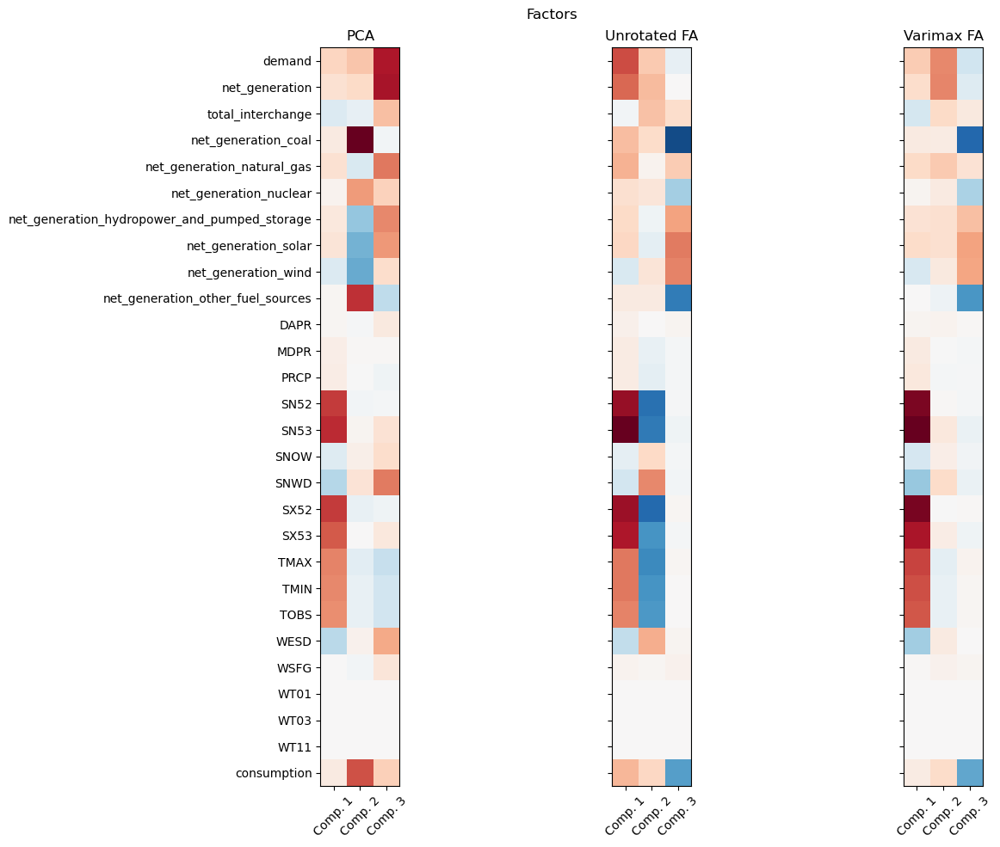

In [13]:
n_comps =3

methods = [
    ("PCA", PCA()),
    ("Unrotated FA", FactorAnalysis()),
    ("Varimax FA", FactorAnalysis(rotation="varimax")),
]
fig, axes = pyplot.subplots(ncols=len(methods), figsize=(15, 10), sharey=True)

for ax, (method, fa) in zip(axes, methods):
    fa.set_params(n_components=n_comps)
    fa.fit(s_corr_data)

    components = fa.components_.T
    print("\n\n %s :\n" % method)
    print(components)

    vmax = np.abs(components).max()
    ax.imshow(components, cmap="RdBu_r", vmax=vmax, vmin=-vmax)
    ax.set_yticks(np.arange(len(feature_names)))
    ax.set_yticklabels(feature_names)
    ax.set_title(str(method))
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(["Comp. 1", "Comp. 2", 'Comp. 3'],rotation=45)
#pyplot.colorbar(components).ax.set_ylabel("$r$", rotation=0)   
fig.suptitle("Factors")
pyplot.tight_layout()
pyplot.show()

We are ploting the correlation matrix analyisis, the strong red is 1 and the strong blue is -1. The larger the value the most it weights in the compoenent.
We are reducing from 28 features to 3.

In [14]:
## Global variables and settings and helper functions

### Plot settings

In [15]:
pyplot.style.use("seaborn-v0_8-whitegrid")
pyplot.rc("figure", autolayout=True, figsize=(11, 5))
pyplot.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'


### Global vairables

In [16]:
years=['2016','2017','2018','2019','2020','2021','2022','2023','2024']
months=['jan','fev','march','april','may','jun','jul','aug','sep','oct','nov','dec']
columns=[data.columns]


### Helper functions

In [17]:
#This function fileters the data frame by a series returns a series with a timeindex
def select_series(df,column, dateCol='date'):
    df['idx'] = pd.DatetimeIndex(df[dateCol])
    df = df.set_index('idx')
    df = df.drop(dateCol, axis=1)
    return df[column]

In [18]:
#this function takes a data frame, a series and divided the series by month, 
# returs a dictiornary by month for  the selected series
def montly_series(data,ser):
    series_dict=dict()
    name_series=[y+'_'+m for y in years for m in months]
    beg_end_months=pd.DataFrame(data=pd.to_datetime(data['date'].to_list()).normalize(), index=data['date'].to_list()).resample('MS')[0].agg(['min', 'max'])

    min_day=beg_end_months['min'].to_list()

    max_day=beg_end_months['max'].to_list()
   
    for d in range(105):
       series_dict.update({name_series[d]:data[(data.date >= min_day[d])&(data.date <= max_day[d])][ser].reset_index(drop=True)})
       
    return (series_dict)

<Axes: xlabel='idx'>

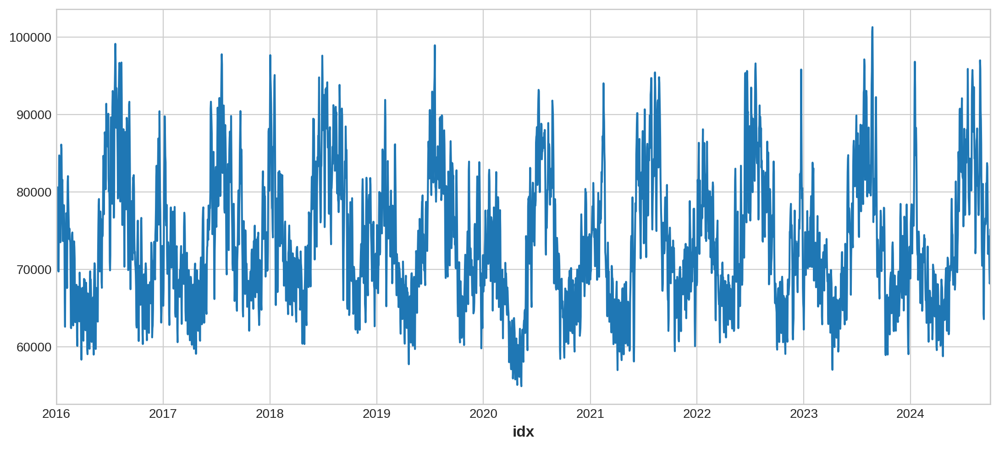

In [19]:
series = select_series(data,'demand')
series.plot()

## Seasonal decompose 

In [20]:
def plot_decomp(result,df,s):
    fig, (ax1, ax2, ax3, ax4) = pyplot.subplots(4, 1, figsize=(15, 7))
    ax1.plot(df[s], label='data', color='black')
    ax1.set_title(s)
    ax2.plot(df.date, result.trend, label='Trend', color='red')
    ax2.set_title('Trend Component')
    ax3.plot(df.date, result.seasonal, label='Seasonal', color='blue')
    ax3.set_title('Seasonal Component')
    ax4.plot(df.date, result.resid, label='Residual')
    ax4.set_title('Residual Component')
    pyplot.tight_layout()
    pyplot.show()

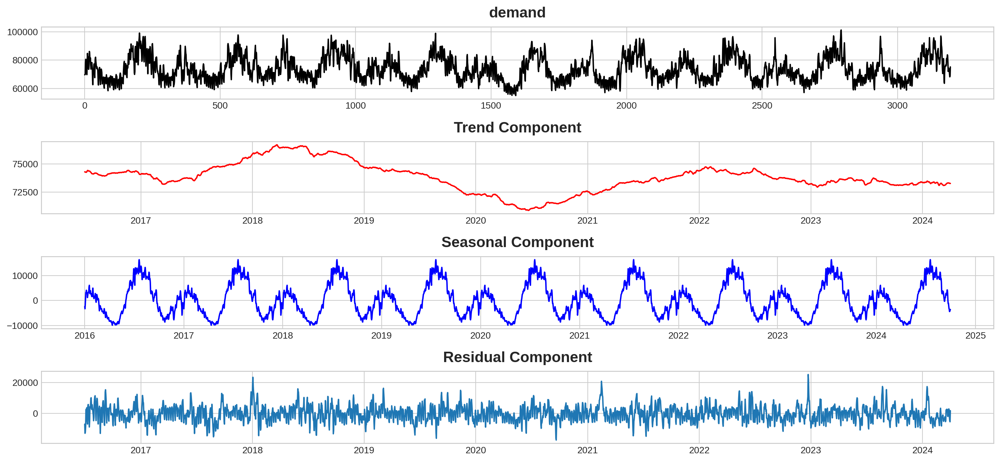

In [21]:
#eletricticy consumption
series = select_series(data,'demand')
resu = seasonal_decompose(series, model='additive', period=365)
plot_decomp(resu,data,'demand')

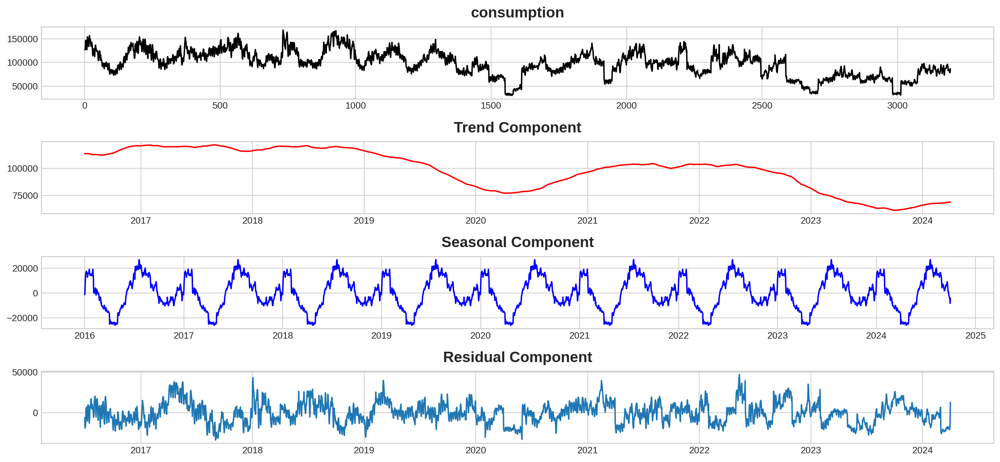

In [22]:
#eletricticy demand
series = select_series(data,'consumption')#.loc["2016-01-01":"2017-01-01"]
result = seasonal_decompose(series, model='additive', period=365)
plot_decomp(result,data,'consumption')

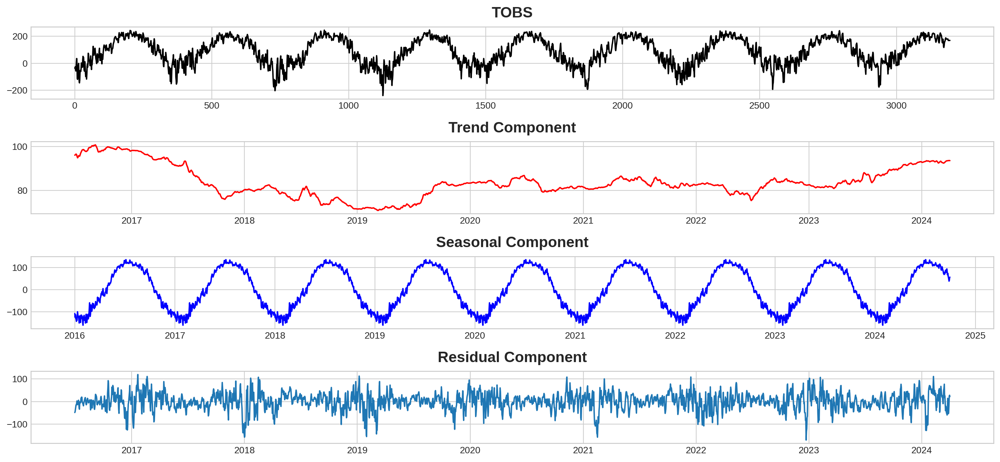

In [23]:
#weather tobs
tobs = select_series(data,'TOBS')#.loc["2016-01-01":"2017-01-01"]
res_tobs = seasonal_decompose(tobs, model='additive', period=365)
plot_decomp(res_tobs,data,'TOBS')

## LOESS decompose - 

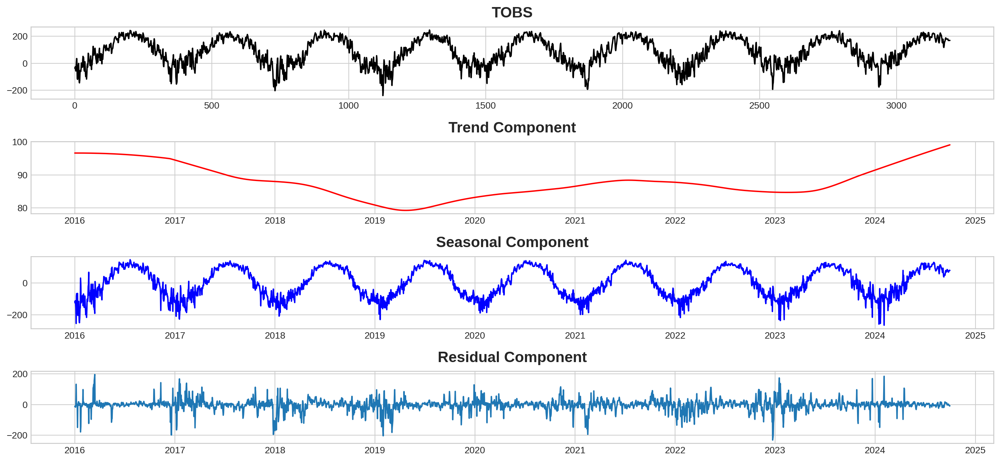

In [24]:
#LOESS
loess_tobs = STL(tobs, period=365, robust=True).fit()
plot_decomp(loess_tobs,data,'TOBS')

## PY Wavelet

Robust to time-scale variations:
Wavelet transforms can better handle time distortions and variations in the signal's pace, making DTW comparisons more accurate. 
Focus on relevant features:
By extracting wavelet coefficients, you can focus on the most important frequency of your data, potentially improving the accuracy of similarity analysis, and also other supervised learing tasks
Application to complex signals:
Wavelet analysis is particularly useful for analyzing non-stationary signals, where the frequency content changes over time, which is common in real-world time series data. 


### Plot settings

In [25]:
def plotting_wavelets(series):
    # Plot the original and decomposed signals
    #plt.figure(figsize=(12, 6))
    pyplot.subplot(2, 1, 1)
    pyplot.plot(series)
    pyplot.title("Original Signal")

    pyplot.subplot(2, 1, 2)
    for i, coeff in enumerate(coeffs):
        pyplot.plot(coeff, label=f"Level {i}")
    pyplot.legend()
    pyplot.title("Wavelet Decomposition")
    pyplot.show()

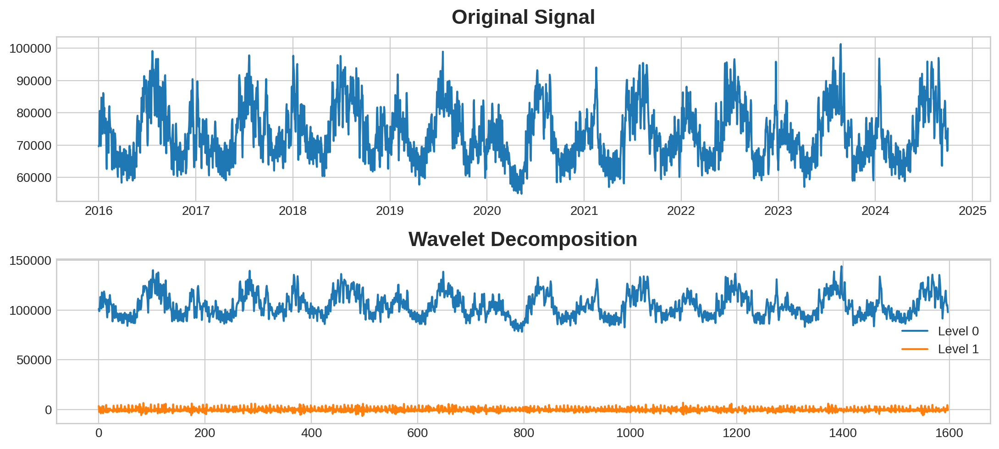

In [26]:
wave_demand=select_series(data,'demand')

coeffs = pywt.dwt(wave_demand, 'db4', mode='periodization')

# Reconstruct the original signal from the coefficients
reconstructed_signal = pywt.waverec(coeffs,'db4', mode='periodization')

plotting_wavelets(wave_demand)



In [27]:
print (coeffs)

(array([101098.22704791,  98804.66894306, 102610.05674176, ...,
       104299.23777311, 104906.68402013,  97728.77793438]), array([ 3706.63367525, -2384.61468113,   510.44316326, ...,
        -541.85200589,  4627.17176504,  -335.86904113]))


## Preparing montly series for clustering

montly_series() takes two argument, df and a string to indicate the feature. It is a helper function that returns a dictionay with the monthly series. Features list, and other global variables on top of helper function section

In [28]:
def preparing_monthly_series(df,series):
    m_series=montly_series(df,series)
    s_=pd.DataFrame(m_series)
    #solving NaN
    S_df=s_.ffill().bfill().T.reindex()
    return (S_df)

In [29]:
TOBS_df=preparing_monthly_series(data,'TOBS')

In [30]:
TOBS_df.head()

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
2016_jan,-34.0,-39.0,-26.0,-50.0,-57.0,-26.0,14.0,35.0,-7.0,-113.0,...,-52.0,-60.0,-39.0,2.0,-1.0,-29.0,-3.0,-29.0,26.0,51.0
2016_fev,23.0,44.0,5.0,-49.0,-58.0,-19.0,11.0,-29.0,-75.0,-99.0,...,20.0,21.0,12.0,-5.0,-18.0,17.0,54.0,19.0,19.0,19.0
2016_march,-8.0,-46.0,-1.0,-12.0,18.0,34.0,88.0,125.0,106.0,76.0,...,55.0,70.0,60.0,8.0,39.0,62.0,44.0,48.0,94.0,111.0
2016_april,54.0,21.0,41.0,31.0,22.0,72.0,44.0,24.0,-4.0,57.0,...,105.0,93.0,117.0,135.0,118.0,103.0,102.0,97.0,106.0,106.0
2016_may,110.0,103.0,106.0,95.0,92.0,121.0,138.0,119.0,133.0,142.0,...,153.0,158.0,177.0,187.0,190.0,189.0,198.0,194.0,192.0,183.0


In [31]:
demand_df=preparing_monthly_series(data,'demand')

In [32]:
demand_df.tail()

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
2024_may,69796.0,70192.0,67440.0,64569.0,62077.0,68938.0,71536.0,71403.0,70697.0,67000.0,...,76124.0,74671.0,74470.0,69615.0,68023.0,68263.0,71124.0,70525.0,71568.0,70281.0
2024_jun,67398.0,68194.0,78646.0,81365.0,78418.0,76195.0,74771.0,70502.0,69643.0,73067.0,...,85469.0,82567.0,90279.0,92105.0,86021.0,82043.0,81793.0,83757.0,75565.0,75565.0
2024_jul,80030.0,82260.0,88167.0,80682.0,79145.0,77048.0,79319.0,86784.0,84576.0,83779.0,...,84325.0,84043.0,83164.0,83239.0,82358.0,80198.0,82582.0,92439.0,94475.0,95754.0
2024_aug,94263.0,92603.0,88412.0,87738.0,93548.0,87831.0,84323.0,84418.0,79717.0,72090.0,...,77592.0,80684.0,82203.0,87101.0,97006.0,95859.0,90457.0,89324.0,86198.0,77777.0
2024_sep,72732.0,70484.0,75796.0,78286.0,81046.0,74920.0,64276.0,63587.0,71706.0,74447.0,...,72008.0,73941.0,74301.0,73647.0,72928.0,70208.0,68188.0,68686.0,75171.0,75171.0


In [33]:
indices, rowSeries = zip(*demand_df.iterrows())


In [34]:
series_names=demand_df.index.to_list()

## Dynamic Time Wrapping simmilarity for Kmeans clustering

The Dynamic time wrapping will provide the similartiy measure to be applied to the kmeans clustering. this is going to be a shape base clustering.
We are taking Silhouette score that measures how similar an object is to its own cluster compared to other clusters. It's calculated based on the average distance between data points within and between clusters

In [35]:
seed=42

In [36]:
def plotting_clusters(labels,series_name,series_list):
    plot_count = math.ceil(math.sqrt(cluster_count))

    fig, axs = pyplot.subplots(plot_count,plot_count,figsize=(25,25))
    fig.suptitle(str(series_name), fontsize=30,fontweight='bold')
    row_i=0
    column_j=0
    for label in set(labels):
        cluster = []
        for i in range(len(labels)):
                if(labels[i]==label):
                    axs[row_i, column_j].plot(series_list[i],c="gray",alpha=0.7)
                    cluster.append(series_list[i])
        if len(cluster) > 0:
            axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        axs[row_i, column_j].set_title("Cluster "+str(row_i*plot_count+column_j))
        column_j+=1
        if column_j%plot_count == 0:
            row_i+=1
            column_j=0
        
    pyplot.show()

In [37]:
series_names=demand_df.index.to_list()

In [38]:
def mapping_clusters(labels,columns=series_names):
    clusters_data=list(zip(columns, labels))
    
    cluster_map=pd.DataFrame(clusters_data)
    cluster_map=cluster_map.rename({0:'series', 1: 'cluster'},axis=1).reset_index(drop=True)
    
    cluster_map=cluster_map.sort_values('cluster')
    #grouped_clusters=cluster_map.groupby('cluster')
    return cluster_map

Clustering temperature

In [39]:
cluster_count = math.ceil(math.sqrt(len(TOBS_df))) 
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN
X_train=TOBS_df
scaler=MinMaxScaler()
X_train=scaler.fit_transform(X_train)
km = TimeSeriesKMeans(n_clusters=12, metric="dtw",random_state=seed)

labels_tobs = km.fit_predict(X_train)
score = silhouette_score(X_train, labels_tobs, metric='euclidean')
print(f'Silhouette Score: {score}')

Silhouette Score: 0.1837715308955078


In [40]:
print(labels_tobs)

[ 4  8  3  3  5  0  0  0 11  3  7  2  2  8  8  3  5  0  0  0 11  7  8  6
 10  2  8  8  0  0  0  0 11  7  8  8  6  9  2  3  5  0  0  0  0  7  8  2
  4  2  8  3  5  0  0  0 11  7  1  4  4  2  8  3  5  0  0  0 11  7  8  8
  9  9  8  3  5  0  0  0 11  3  1  4  4  4  8  3  5  0  0  0 11  7  1  8
  4  8  8  3 11  0  0  0 11]


Plotting the basic clusters for TOBS

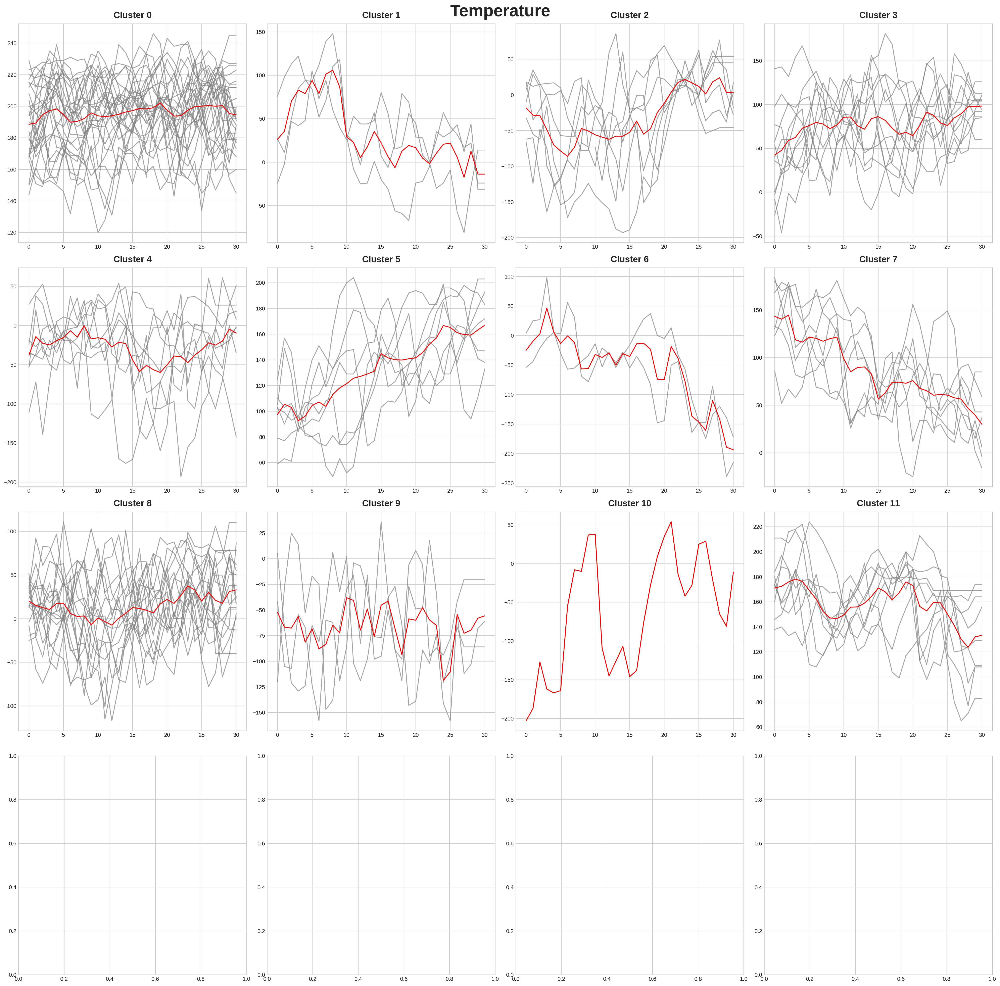

In [41]:
indices, rowSeries = zip(*TOBS_df.iterrows())
plotting_clusters(labels_tobs,"Temperature",rowSeries)


       

In [42]:
print(labels_tobs)

[ 4  8  3  3  5  0  0  0 11  3  7  2  2  8  8  3  5  0  0  0 11  7  8  6
 10  2  8  8  0  0  0  0 11  7  8  8  6  9  2  3  5  0  0  0  0  7  8  2
  4  2  8  3  5  0  0  0 11  7  1  4  4  2  8  3  5  0  0  0 11  7  8  8
  9  9  8  3  5  0  0  0 11  3  1  4  4  4  8  3  5  0  0  0 11  7  1  8
  4  8  8  3 11  0  0  0 11]


In [43]:
cluster_map=mapping_clusters(labels_tobs,columns=series_names)

In [44]:
cluster_map.head()

,series,cluster
90,2023_jul,0
91,2023_aug,0
89,2023_jun,0
18,2017_jul,0
17,2017_jun,0


### Clustering demand

In [45]:
cluster_count = math.ceil(math.sqrt(len(demand_df))) 
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN
X_train=demand_df
scaler=MinMaxScaler()
X_train=scaler.fit_transform(X_train)
km = TimeSeriesKMeans(n_clusters=12, metric="dtw",random_state=seed)

labels_dm = km.fit_predict(X_train)
score = silhouette_score(X_train, labels_dm)
print(f'Silhouette Score: {score}')

Silhouette Score: 0.019885544683037402


In [46]:
print (labels_dm)

[11  2  4  4  1  3  3  7  9 10  1  5  9  2 10  4  1  9  3  7  9 10  5  6
  8  5 10 10  6  0  8  3  2  2 11 11  6 11  2  4  1  6  8  3  6  2  2  2
 11 11  4  4  4  6  8  3  2  4  1  5 11  9  4  4  4  6  3  3  5  4  1 10
  6 11 10  4  6  3  3  8  2  4  1  9  6  5 10  4  1  0  3  8  9  2  1 10
  9  1  4  4  1  9  0  7  5]


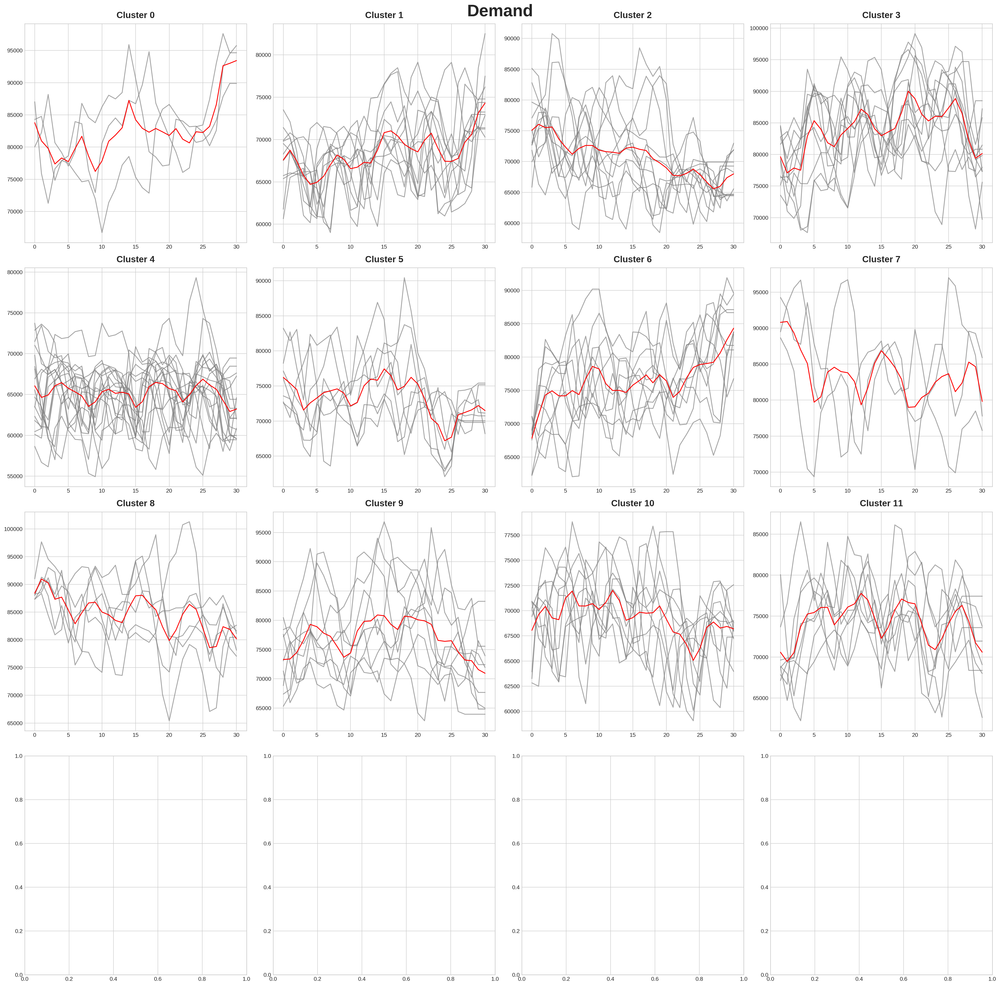

In [47]:
indices, rowSeries = zip(*demand_df.iterrows())

plotting_clusters(labels_dm,"Demand",rowSeries)


In [48]:
cluster_map=mapping_clusters(labels_dm,columns=series_names)

In [49]:
cluster_map.head()

,series,cluster
89,2023_jun,0
29,2018_jun,0
102,2024_jul,0
94,2023_nov,1
82,2022_nov,1


### Clustering the selected features of the complete dataset
Selected features are Demand, SX53, SX53.
We are working with a montly aggregation of the features.
In order to still create a view that shows this values in a timeline, we took the mean of the clustered features and created a scatter plot that shows the data points that were clustered together by month along the ten years.
Examining the cluster months we can see that there are similar months within the same year that are close respecting a typical yearly season and also we have some months that are irregular and that were clustered with months from a different group and year.

In [50]:
#selecting the features
df_all=data[['date','demand', 'SX52', 'SX53']]

In [51]:
df_all.set_index('date', inplace=True)

In [52]:
df_all=df_all.resample('ME').mean()



In [53]:
df_all_names=df_all.index.to_list()

In [54]:
df_all['mean']=df_all.mean(axis=1)

In [55]:
df_all

,demand,SX52,SX53,mean
date,,,,
2016-01-31,76164.709677,44.516129,16.516129,25408.580645
2016-02-29,72661.068966,49.586207,9.482759,24240.045977
2016-03-31,66626.225806,92.838710,10.096774,22243.053763
2016-04-30,65427.766667,124.700000,39.433333,21863.966667
2016-05-31,68037.741935,178.903226,116.935484,22777.860215
...,...,...,...,...
2024-05-31,69898.548387,204.387097,152.516129,23418.483871
2024-06-30,80917.633333,242.000000,180.466667,27113.366667
2024-07-31,84469.258065,258.677419,208.387097,28312.107527


In [56]:
df_all_mean=df_all['mean'].to_frame()

In [57]:
df_all_mean=df_all_mean.reset_index(drop=True)

In [58]:
df_all_mean_list=df_all_mean['mean'].to_list()

In [59]:
cluster_count = math.ceil(math.sqrt(len(df_all_mean))) 
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN
X_train=df_all_mean
scaler=MinMaxScaler()
X_train=scaler.fit_transform(X_train)
km = TimeSeriesKMeans(n_clusters=12, metric="dtw",random_state=seed)

labels_all = km.fit_predict(X_train)

In [60]:
cluster_map_all=mapping_clusters(labels_all,columns=df_all_names)

In [61]:
cluster_map_all=cluster_map_all.join(df_all_mean)

In [62]:
cluster_number=12
cluster_number_list=[]
for i in range(cluster_number):
    cluster_number_list.append('C_{}'.format(i))

In [63]:
filter_clusters=[]
for v in cluster_number_list:
    for i in range(cluster_number):
        v=df_all_mean[labels_all==i]
        filter_clusters.append(v)
    

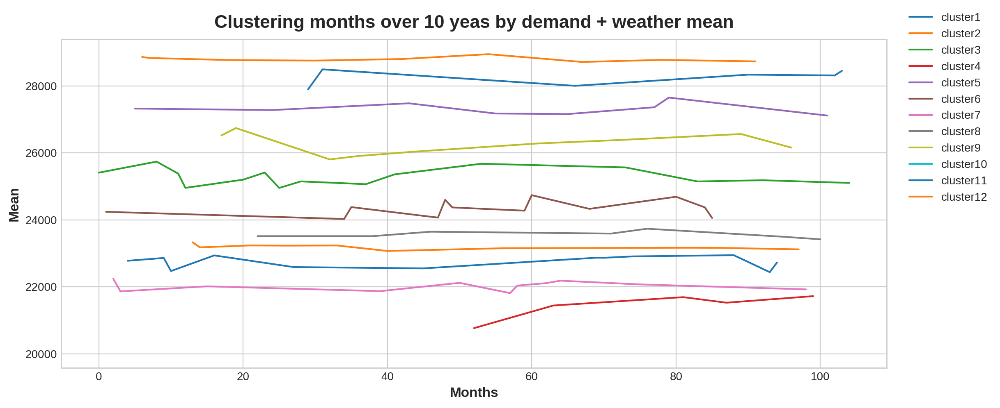

In [64]:
colors = pyplot.cm.tab20(range(12))
fig, axs = pyplot.subplots()

  
for f in range(12):#len(filter_clusters)):
    axs.plot(filter_clusters[f].index.values,
                filter_clusters[f]['mean'], label=f"cluster{f+1}")
    
axs.set_xlabel("Months"),
axs.set_ylabel("Mean"),
axs.set_title("Clustering months over 10 yeas by demand + weather mean")   

labels_handles = {
    label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())
    }

fig.legend(
  labels_handles.values(),
  labels_handles.keys(),
  loc = "upper left",
  bbox_to_anchor = (1, 1),
  bbox_transform = pyplot.gcf().transFigure,
)
pyplot.show()

In [65]:
pd.set_option('display.max_rows', None)

display(cluster_map_all)

,series,cluster,mean
90,2023-07-31,0,28335.602151
31,2018-08-31,0,28493.870968
29,2018-06-30,0,27894.677778
66,2021-07-31,0,28002.182796
103,2024-08-31,0,28449.903226
102,2024-07-31,0,28312.107527
86,2023-03-31,1,23163.526882
13,2017-02-28,1,23329.630952
56,2020-09-30,1,23152.077778
33,2018-10-31,1,23234.817204
